# Problem Description
**Try to predict the ordinal variable damage_grade, which represents a level of damage to the building that was hit by the earthquake. There are 3 grades of the damage**

- 1: represents low damage
- 2: represents a medium amount of damage
- 3: represents almost complete destruction


In [1]:
#importing liabraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report
from sklearn.metrics import confusion_matrix
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
plt.style.use('seaborn')

In [2]:
# importing datasets
train=pd.read_csv("train_values.csv")
labels=pd.read_csv("train_labels.csv")
# improrting tesing dataset
test=pd.read_csv("test_values.csv")
# adding labels to train dataset
train["damage_grade"]=labels["damage_grade"]
print("shape of the train dataset is : ",chr(128516),train.shape)
print("shape of the test dataset is  : ",chr(128513),test.shape)

shape of the train dataset is :  😄 (260601, 40)
shape of the test dataset is  :  😁 (86868, 39)


In [3]:
train.head(10)

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,802906,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,28830,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,94947,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,590882,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,201944,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
5,333020,8,558,6089,2,10,9,5,t,r,n,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,1,1,0,0,0,0,0,0,0,0,0,2
6,728451,9,475,12066,2,25,3,4,n,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
7,475515,20,323,12236,2,0,8,6,t,w,q,v,x,s,u,0,0,0,0,0,1,1,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,1
8,441126,0,757,7219,2,15,8,6,t,r,q,f,q,s,d,0,1,0,0,0,0,1,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
9,989500,26,886,994,1,0,13,4,t,i,n,v,j,s,d,0,0,0,0,0,1,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,1


In [4]:
# exploring the statstical fearures of train dataset.
train.describe().T.style.background_gradient(cmap='Set2',low =0.4,high=0.1,axis=0)

,count,mean,std,min,25%,50%,75%,max
building_id,260601.000000,525675.482773,304544.999032,4.000000,261190.000000,525757.000000,789762.000000,1052934.000000
geo_level_1_id,260601.000000,13.900353,8.033617,0.000000,7.000000,12.000000,21.000000,30.000000
geo_level_2_id,260601.000000,701.074685,412.710734,0.000000,350.000000,702.000000,1050.000000,1427.000000
geo_level_3_id,260601.000000,6257.876148,3646.369645,0.000000,3073.000000,6270.000000,9412.000000,12567.000000
count_floors_pre_eq,260601.000000,2.129723,0.727665,1.000000,2.000000,2.000000,2.000000,9.000000
age,260601.000000,26.535029,73.565937,0.000000,10.000000,15.000000,30.000000,995.000000
area_percentage,260601.000000,8.018051,4.392231,1.000000,5.000000,7.000000,9.000000,100.000000
height_percentage,260601.000000,5.434365,1.918418,2.000000,4.000000,5.000000,6.000000,32.000000
has_superstructure_adobe_mud,260601.000000,0.088645,0.284231,0.000000,0.000000,0.000000,0.000000,1.000000
has_superstructure_mud_mortar_stone,260601.000000,0.761935,0.425900,0.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
# exploring the statstical fearures of train dataset (object).
train.describe(include="object").T

,count,unique,top,freq
land_surface_condition,260601,3,t,216757
foundation_type,260601,5,r,219196
roof_type,260601,3,n,182842
ground_floor_type,260601,5,f,209619
other_floor_type,260601,4,q,165282
position,260601,4,s,202090
plan_configuration,260601,10,d,250072
legal_ownership_status,260601,4,v,250939


In [6]:
# checking the types of varibles in the dataset(int,float,object)
dtypes=pd.DataFrame(train.dtypes,columns=["Data Type"])
dtypes["Unique Values"]=train.nunique()
dtypes["Null Values"]=train.isnull().sum()
dtypes["% null Values"]=train.isnull().sum()/len(train)
dtypes.style.background_gradient(cmap='Set2',axis=0)

,Data Type,Unique Values,Null Values,% null Values
building_id,int64,260601,0,0.000000
geo_level_1_id,int64,31,0,0.000000
geo_level_2_id,int64,1414,0,0.000000
geo_level_3_id,int64,11595,0,0.000000
count_floors_pre_eq,int64,9,0,0.000000
age,int64,42,0,0.000000
area_percentage,int64,84,0,0.000000
height_percentage,int64,27,0,0.000000
land_surface_condition,object,3,0,0.000000
foundation_type,object,5,0,0.000000


### ***Damage Grade***

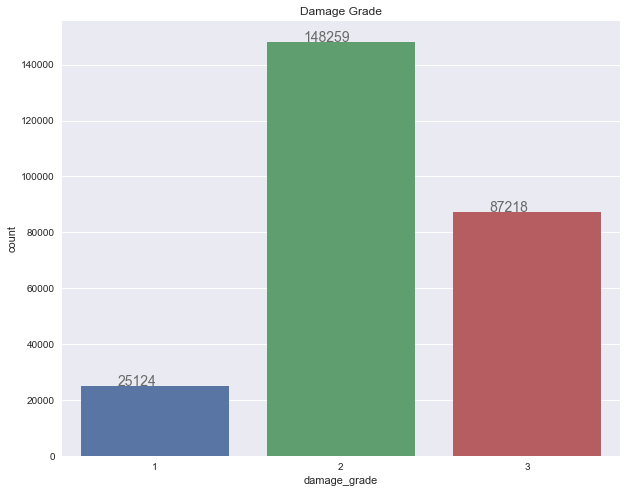

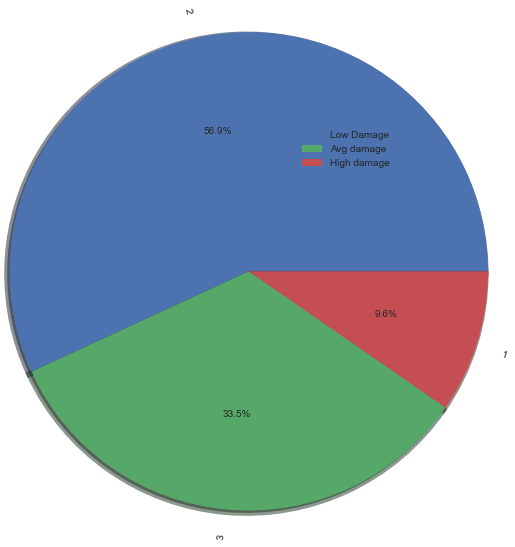

In [7]:
# checking the dependent variable --> `damage_grade`
plt.figure(figsize=(10,8))
ax=sns.countplot("damage_grade",data=train)
for i in ax.patches:
    # get_x pulls left or right; get_height pushes up or down
    ax.text(i.get_x()+0.2, i.get_height()+3, \
            str(round((i.get_height()), 2)), fontsize=14, color='dimgrey')
plt.title("Damage Grade")
plt.show()  

train["damage_grade"].dropna().astype(int).value_counts().plot.pie(autopct="%.1f%%", 
                                                    shadow=True,rotatelabels=True,
                                                    wedgeprops={'linewidth': 6},
                                                    radius=2
                                                    )
plt.legend(["Low Damage","Avg damage","High damage"])
plt.show()

### ***Now we will see if the age of the building affect on damage due to earthquake ?***

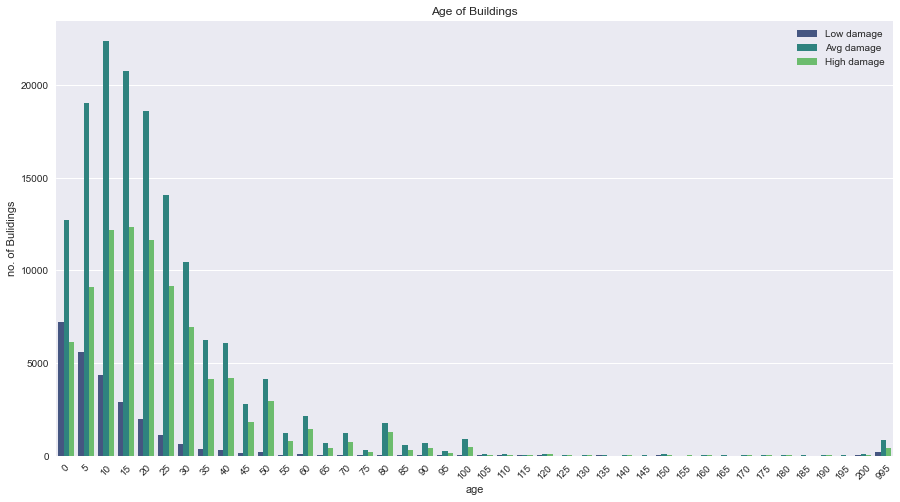

In [8]:

plt.figure(figsize=(15,8))
sns.countplot(x=train["age"],hue=train["damage_grade"],palette="viridis")
plt.ylabel("no. of Bulidings")
plt.title("Age of Buildings")
plt.legend(["Low damage","Avg damage","High damage"],loc="upper right")
plt.xticks(rotation=45)
plt.show()

### ***Does the area of buliding affect on damage caused due to earthquake ?***

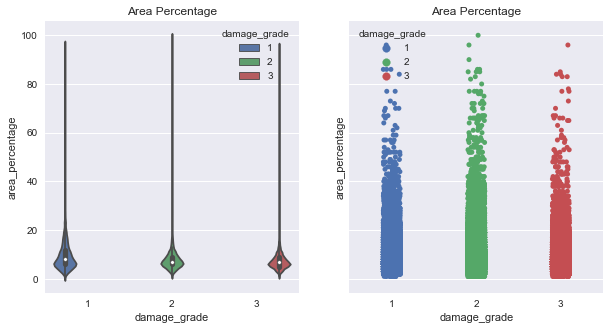

<Figure size 720x648 with 0 Axes>

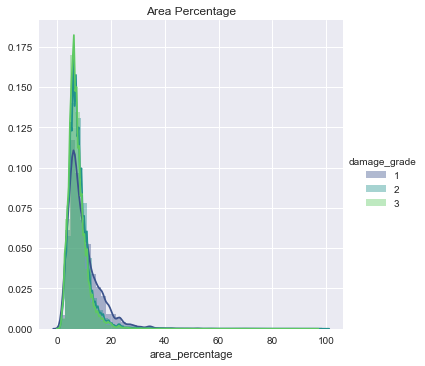

In [9]:
fig,ax=plt.subplots(1,2,figsize=(10,5), sharey=True)
#Violin plot

sns.violinplot(data=train,x='damage_grade',y='area_percentage',hue='damage_grade',
                   split=False,ax=ax[0])

sns.stripplot(data=train,x='damage_grade',y='area_percentage',hue='damage_grade',jitter=True,ax=ax[1])
#plt.ylabel("Company Status",**font)
ax[0].set_title("Area Percentage")
ax[1].set_title("Area Percentage")
plt.show()
#Facet Grid

plt.figure(figsize=(10,9))
sns.FacetGrid(train,hue='damage_grade',height=5,palette="viridis")\
    .map(sns.distplot,'area_percentage')\
    .add_legend()
plt.title("Area Percentage")
plt.show()

### ***Does the height of buliding affect on damage caused due to earthquake ?***

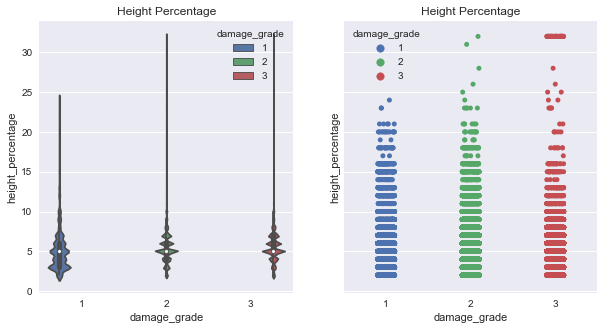

<Figure size 720x360 with 0 Axes>

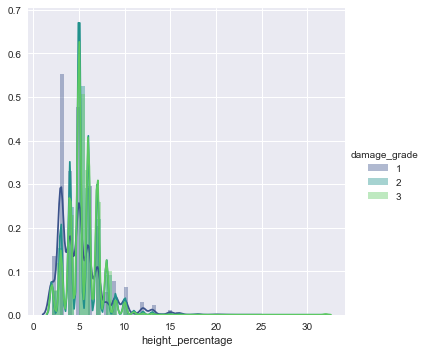

In [10]:
fig,ax=plt.subplots(1,2,figsize=(10,5), sharey=True)

#Violin plot

sns.violinplot(data=train,x='damage_grade',y='height_percentage',hue='damage_grade',
                   split=False,ax=ax[0])

sns.stripplot(data=train,x='damage_grade',y='height_percentage',hue='damage_grade',jitter=True,ax=ax[1])
#plt.ylabel("Company Status",**font)
ax[0].set_title("Height Percentage")
ax[1].set_title("Height Percentage")
plt.show()

#Facet Grid

plt.figure(figsize=(10,5))
sns.FacetGrid(train,hue='damage_grade',height=5,palette="viridis")\
    .map(sns.distplot,'height_percentage')\
    .add_legend()
plt.show()

### ***Do number of floors in the buliding affect on damage caused due to earthquake ?***

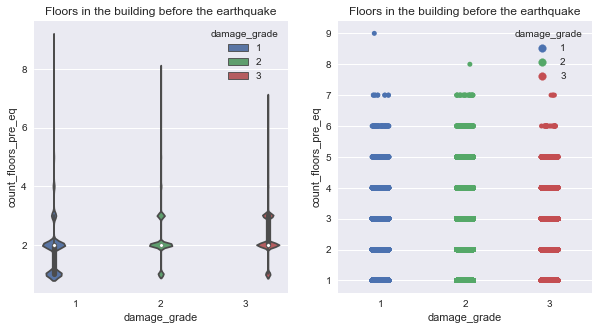

<Figure size 720x360 with 0 Axes>

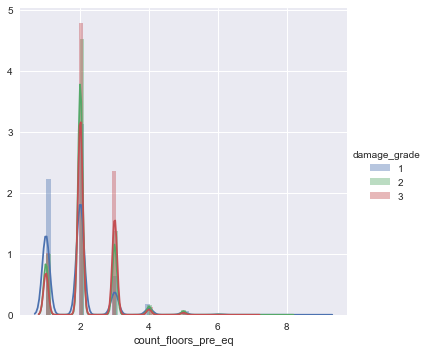

In [11]:
fig,ax=plt.subplots(1,2,figsize=(10,5))

#Violin plot

sns.violinplot(data=train,x='damage_grade',y='count_floors_pre_eq',hue='damage_grade',
                   split=False,ax=ax[0])

sns.stripplot(data=train,x='damage_grade',y='count_floors_pre_eq',hue='damage_grade',jitter=True,ax=ax[1])
#plt.ylabel("Company Status",**font)
ax[0].set_title("Floors in the building before the earthquake")
ax[1].set_title("Floors in the building before the earthquake")
plt.show()

#Facet Grid
plt.figure(figsize=(10,5))
sns.FacetGrid(train,hue='damage_grade',height=5)\
    .map(sns.distplot,'count_floors_pre_eq')\
    .add_legend()
plt.show()

### ***Families affected due to earthquake ?***

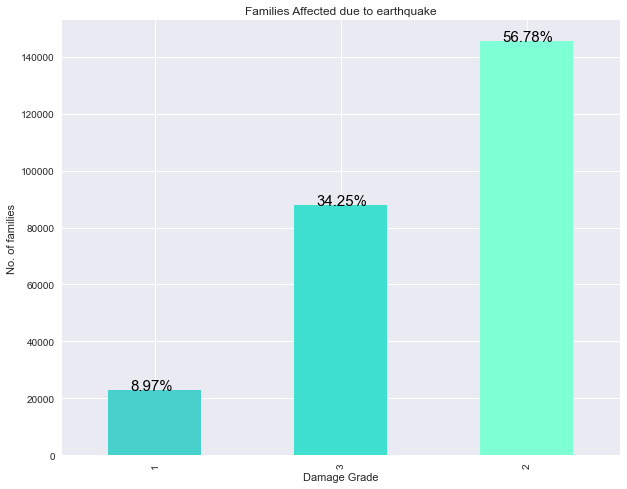

In [12]:
plt.figure(figsize=(10,8))
ax=train.groupby("damage_grade")["count_families"].sum().sort_values().plot.bar(color=["mediumturquoise","turquoise","aquamarine"],
                                                                               )
# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in ax.patches:
    totals.append(i.get_height())

# set individual bar lables using above list
total = sum(totals)

# set individual bar lables using above list
for i in ax.patches:
    ax.text(i.get_x()+.12, i.get_height()+5, \
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=15,
                color='black')
plt.title("Families Affected due to earthquake")
plt.ylabel("No. of families")
plt.xlabel("Damage Grade")
plt.show()

### ***Analyse Categorical Features with respect to Damage Grade ?***

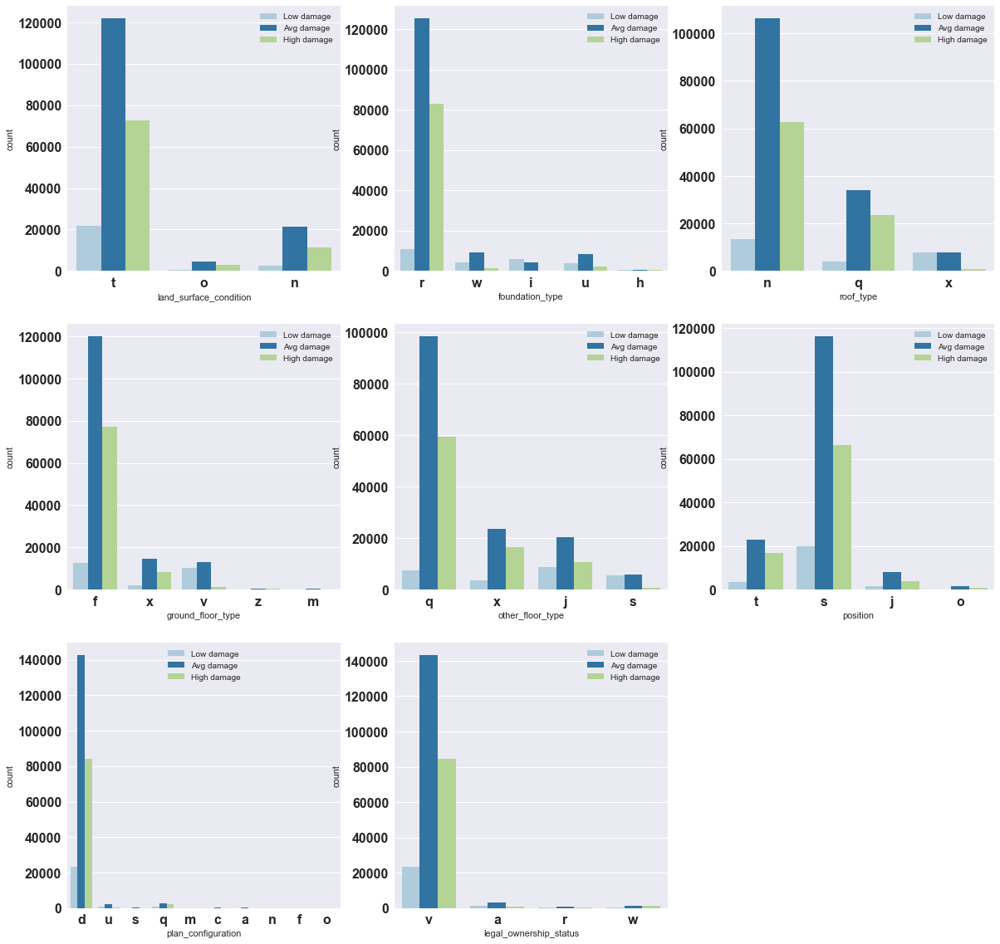

In [13]:
cat_cols=train.select_dtypes(include="object")
font={'weight' : 'bold',
        'size': 16}       
q=1
plt.figure(figsize=(20,20))
for j in cat_cols:
    plt.subplot(3,3,q)
    ax=sns.countplot(train[j].dropna(),palette="Paired",hue=train["damage_grade"])
    plt.xticks(**font)
    plt.yticks(**font)
    plt.xlabel(j)
    plt.legend(["Low damage","Avg damage","High damage"])
    q+=1
plt.show()

### ***Correlation of independent variables with dependant variable ?***

<AxesSubplot:>

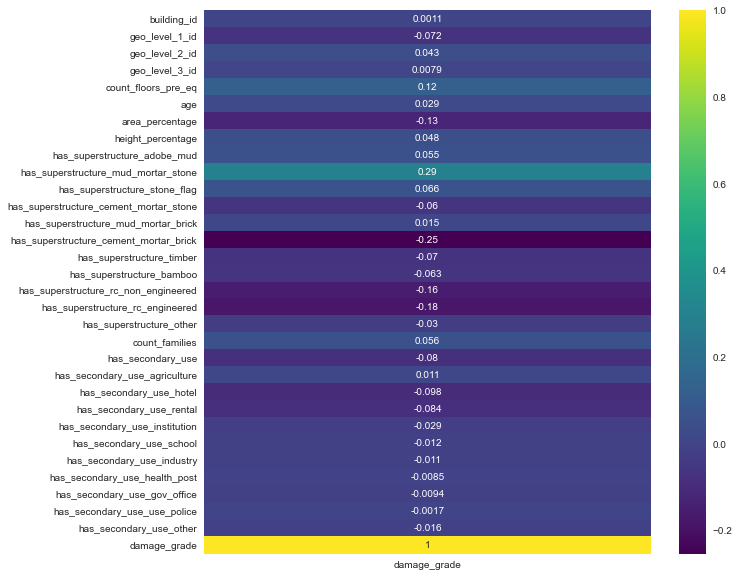

In [14]:
plt.figure(figsize=(10,10))
cor=train.corr()["damage_grade"]
cor=pd.DataFrame(cor)
sns.heatmap(cor,annot=True,cmap="viridis")

### ***Analyse binary Features with respect to Damage Grade ?***

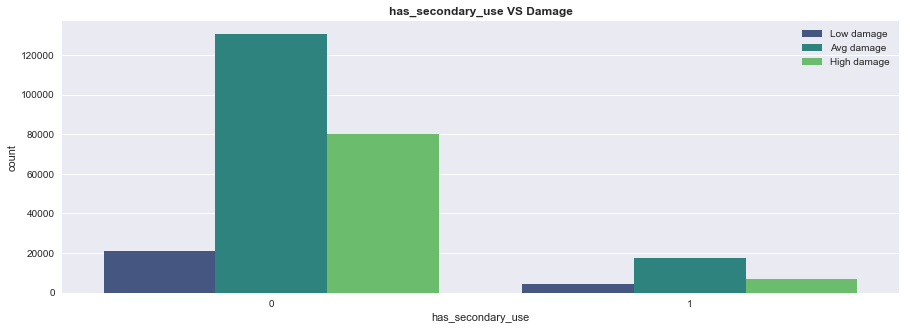

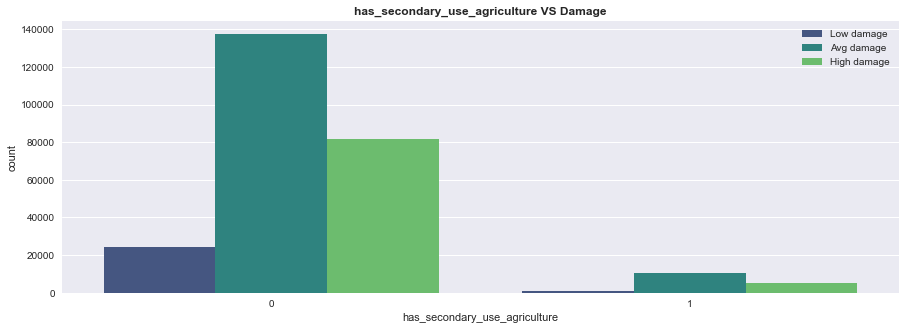

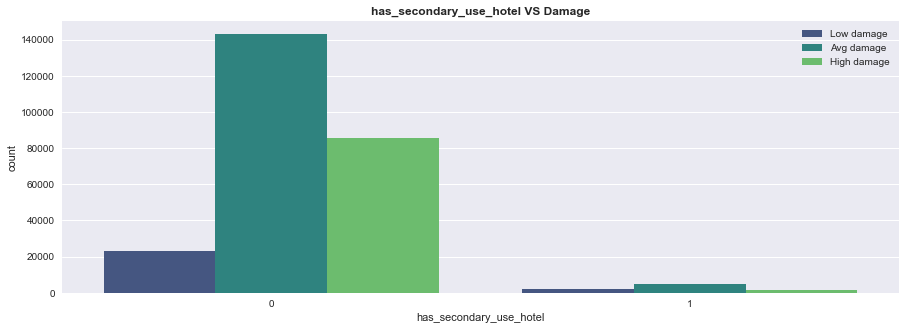

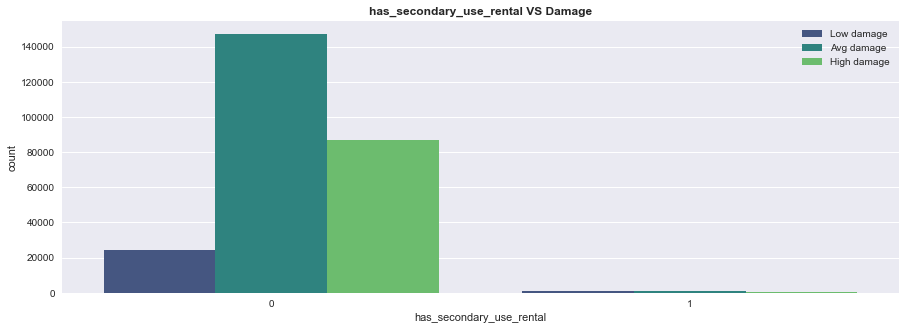

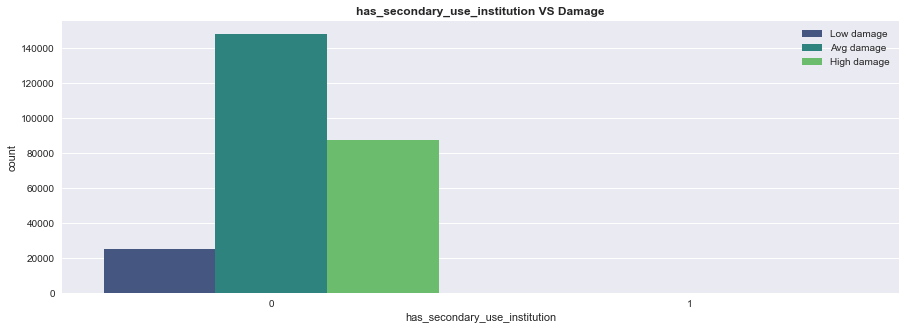

...

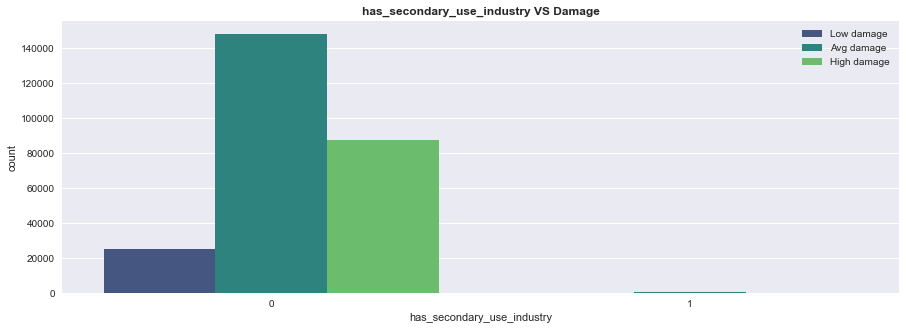

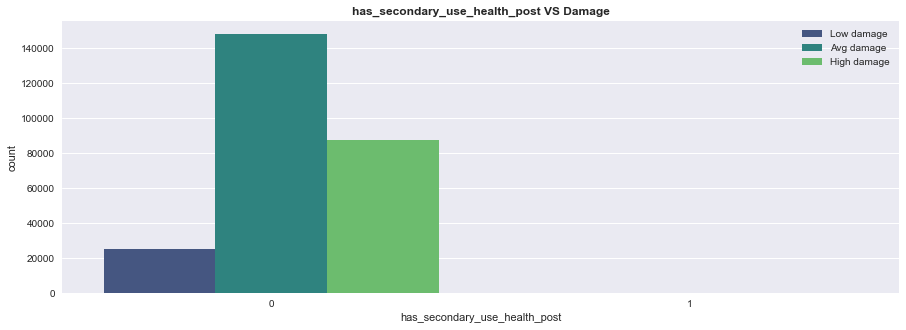

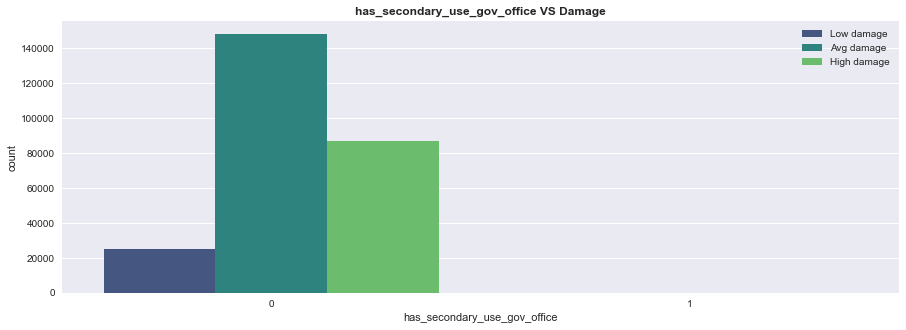

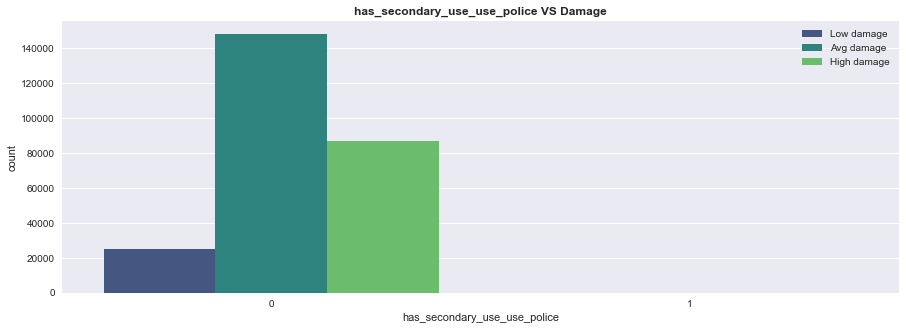

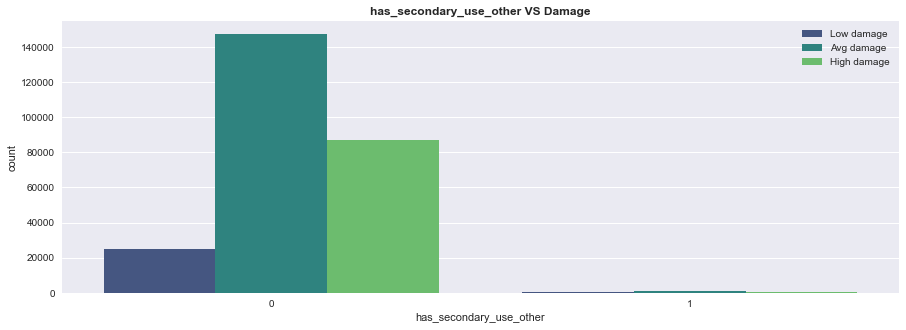

In [15]:
binary_cols=["has_secondary_use","has_secondary_use_agriculture",
          "has_secondary_use_hotel","has_secondary_use_rental","has_secondary_use_institution","has_secondary_use_school","has_secondary_use_industry",
          "has_secondary_use_health_post","has_secondary_use_gov_office","has_secondary_use_use_police","has_secondary_use_other"]
for col in binary_cols:
    plt.figure(figsize=(15,5))
    sns.countplot(train[col],hue=train.damage_grade,palette="viridis")
    plt.title(col+ " VS Damage",fontweight="bold")
    plt.legend(["Low damage","Avg damage","High damage"]) 
    plt.show()

### ***Do we have any outliers in the dataset ?***

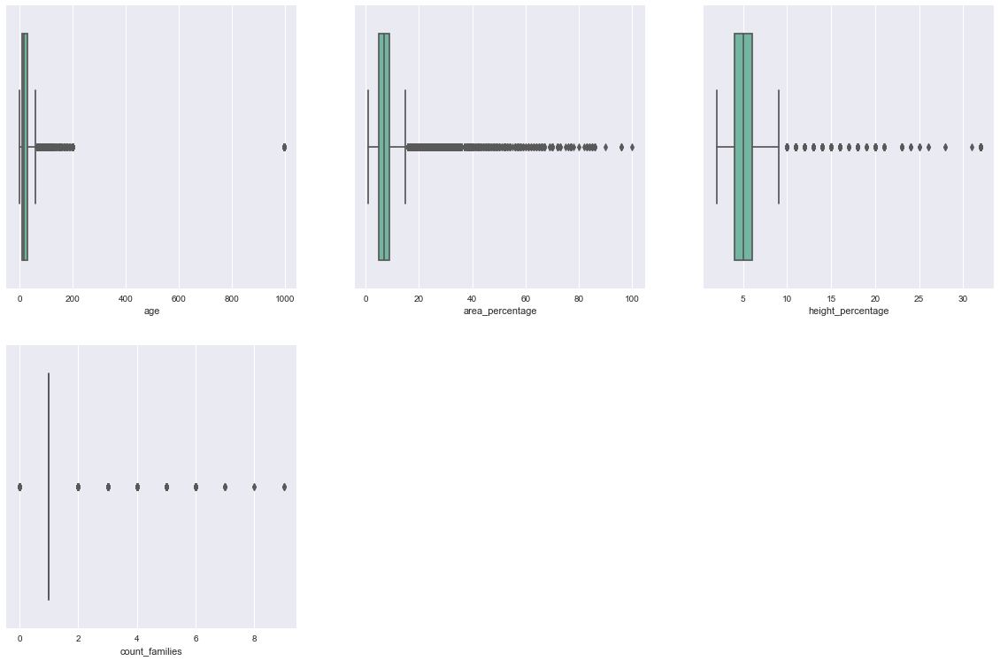

In [16]:
boxplot_cols=["age","area_percentage","height_percentage","count_families"]
q=1
plt.figure(figsize=(20,20))
for j in boxplot_cols:
    plt.subplot(3,3,q)
    ax=sns.boxplot(train[j].dropna(),palette="Set2")
    plt.xlabel(j)
    q+=1
plt.show()

### ***Model Building***

In [17]:
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import GridSearchCV

In [18]:
# copying the original dataset into X
X=train
# droping building_id and dependent variable damage_grade
# independant variables
X=X.drop(["damage_grade","building_id"],axis=1)
# dependent variable
y=train["damage_grade"]

In [19]:
# label encoding the categorical variables
label_encoding_columns=['land_surface_condition', 'foundation_type', 'roof_type',
       'ground_floor_type', 'other_floor_type', 'position',
       'plan_configuration', 'legal_ownership_status']
# label encoding categorical columns in train dataset 
for i in label_encoding_columns:
    X[i]=X[i].astype("category")
    X[i]=X[i].cat.codes
# label encoding categorical columns in test dataset
for j in label_encoding_columns:
    test[j]=test[j].astype("category")
    test[j]=test[j].cat.codes

### ***Selecting Hyperparameter using Grid Search ?***

In [20]:
"""rf = RandomForestClassifier()
param = {'n_estimators': [10, 150, 300],
        'max_depth': [30, 60, 90, None]}

gs = GridSearchCV(rf, param, cv=5, n_jobs=-1)
gs_fit = gs.fit(X, y)
pd.DataFrame(gs_fit.cv_results_).sort_values('mean_test_score', ascending=False)[0:5]"""

"rf = RandomForestClassifier()\nparam = {'n_estimators': [10, 150, 300],\n        'max_depth': [30, 60, 90, None]}\n\ngs = GridSearchCV(rf, param, cv=5, n_jobs=-1)\ngs_fit = gs.fit(X, y)\npd.DataFrame(gs_fit.cv_results_).sort_values('mean_test_score', ascending=False)[0:5]"

### ***Model : Random Forest***

In [21]:
from sklearn.model_selection import train_test_split
x_train, x_test,y_train, y_test = train_test_split(X,y,test_size = 0.20,random_state = 42)

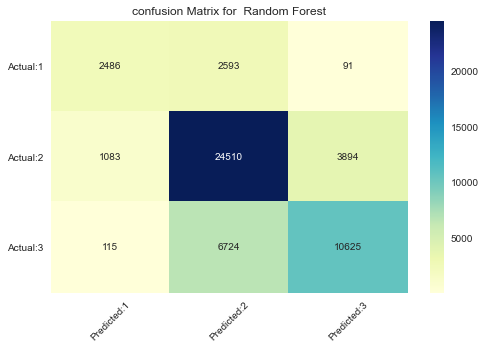

In [22]:
rf = RandomForestClassifier(n_estimators = 500,random_state = 1, max_depth=None,n_jobs=-1)
rf.fit(x_train,y_train)
rf_pred=rf.predict(x_test)
cm=confusion_matrix(y_test,rf_pred)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:1','Predicted:2','Predicted:3'],
                                         index=['Actual:1','Actual:2','Actual:3'])
                                                                            
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")
plt.title("confusion Matrix for  Random Forest")
plt.xticks(rotation=45)
plt.yticks(rotation=360)
plt.show()

In [23]:
print("-"*100)
print("Accuracy Score for Random Forest :",accuracy_score(y_test,rf_pred))
print("-"*100)
print("\n")
print("classification report for Random Forest :\n\n",classification_report(y_test, rf_pred))
print("-"*100)

----------------------------------------------------------------------------------------------------
Accuracy Score for Random Forest : 0.7218011933769498
----------------------------------------------------------------------------------------------------


classification report for Random Forest :

               precision    recall  f1-score   support

           1       0.67      0.48      0.56      5170
           2       0.72      0.83      0.77     29487
           3       0.73      0.61      0.66     17464

    accuracy                           0.72     52121
   macro avg       0.71      0.64      0.67     52121
weighted avg       0.72      0.72      0.72     52121

----------------------------------------------------------------------------------------------------


In [24]:
# now predicting on test dataset
test=test.drop("building_id",axis=1)
rf_pred_test=rf.predict(test)

In [27]:
submission=pd.read_csv("submission_format.csv")
submission=submission.drop("damage_grade",axis=1)
rf_pred_test=pd.DataFrame(rf_pred_test)
submission["damage_grade"]=rf_pred_test
submission

,building_id,damage_grade
0,300051,3
1,99355,2
2,890251,2
3,745817,1
4,421793,3
5,871976,3
6,691228,1
7,896100,3
8,343471,2
9,766647,2
